In [1]:
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import json
import os

torch.hub.set_dir('./torch/hub')
# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.eval()  # Set model to evaluation mode

# Define the image preprocessing transformations
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]   
    )
])

# Load the ImageNet class index mapping
with open("imagenet_class_index.json") as f:
    class_idx = json.load(f)
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label = {v[0]: v[1] for v in class_idx.values()}

imagenet_path = './imagenet_samples'

# List of image file paths
image_paths = os.listdir(imagenet_path)

/home/ajifang/miniconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ajifang/miniconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [2]:
import copy

def differentiable_perturb_image(
        image: torch.Tensor, 
        num_samples: int, 
        epsilon: float, 
        device='cuda'
    ) -> torch.Tensor:
    
    _, C, H, W = image.shape
    noise = torch.randn((num_samples, C, H, W), device=device) * epsilon
    perturbed_images = torch.clamp(image + noise, 0, 1)
    return perturbed_images

def SmoothGrad(
        image: torch.Tensor,
        model: torch.nn.Module, 
        original_label: int, 
        num_samples: int=300, 
        device: str='cuda'
    ) -> torch.Tensor:
    
    model = copy.deepcopy(model)
    model.eval()
    model = model.to(device)
    
    pert_images = differentiable_perturb_image(image, num_samples, 0.5)
    pert_images = pert_images.to(device)
    pert_images = pert_images.requires_grad_(True)
    pert_images.retain_grad()
    
    
    # print('pert_images.shape', pert_images.shape)
    
    yhat = model(pert_images)
    logit = torch.mean(yhat[:, original_label])
    logit.backward(retain_graph=True)
    
    M_c_x_hat = pert_images.grad
    M_c_x_hat = torch.abs(torch.mean(torch.mean(M_c_x_hat, dim=0), dim=0))
    return M_c_x_hat


In [3]:
class PGD_optimizer():
    # ref: https://www.geeksforgeeks.org/custom-optimizers-in-pytorch/
    def __init__(self, params, original_params, epsilon, lr=1e-2):
        self.params = list(params)
        self.original_params = original_params
        self.epsilon = epsilon
        self.lr = lr
                
    def step(self):
        with torch.no_grad():
            for param in self.params:
                if param.grad is not None:
                    if torch.max(torch.abs(param.grad.data)) == 0:
                        print("warning: all gradients are 0")
                    param.data = param.data - self.lr * param.grad.data
                else:
                    print("warning: param.grad is None")
                param.data = torch.clamp(
                    param.data, 
                    min = (self.original_params.data - self.epsilon), 
                    max = (self.original_params.data + self.epsilon)
                )
    
    def zero_grad(self):
        for param in self.params:
            if param.grad is not None:
                param.grad.zero_()

import torch.nn as nn
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_epochs = 5

def pgd_attack(
        epsilon: float, 
        images: torch.Tensor, 
        original_labels: torch.Tensor, 
        original_importance_map: torch.Tensor
    ) -> torch.Tensor:
    print(f'epsilon: {epsilon}')
    
    images = images.clone().detach().to(device)
    original_labels = original_labels.to(device)
    images_original = images.clone().detach()
    criterion_reg = nn.CrossEntropyLoss()
    criterion_attack = nn.MSELoss()
    
    for epoch in range(num_epochs):
        optimizer = PGD_optimizer([images], images_original, epsilon)
        images.requires_grad = True
        optimizer.zero_grad()
        yhat = model(images)
        importance_map = SmoothGrad(images, model, original_labels)
        # print('yhat', yhat.shape, 'original_labels', original_labels.shape)
        loss_reg = criterion_reg(yhat, original_labels)
        # print('importance_map', importance_map.shape, 'original_importance_map', original_importance_map.shape)
        loss_attack = -criterion_attack(importance_map, original_importance_map)
        loss = loss_reg + loss_attack
        # print(epoch, loss.item())
        loss.backward()
        # print(images.grad.data)
        optimizer.step()
        images = images.detach().clone()
    
    assert torch.max(torch.abs(images_original - images)) != 0
    assert torch.max(torch.abs(images_original - images)) <= 1.1 * epsilon
    
    print("#####", torch.max(model(images), 1)[1], "#####")
    return images

In [4]:
import torch.nn as nn
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_epochs = 5

def pgd_attack(
        epsilon: float, 
        images: torch.Tensor, 
        original_labels: torch.Tensor, 
        original_importance_map: torch.Tensor
    ) -> torch.Tensor:
    # print(f'epsilon: {epsilon}')
    
    images = images.clone().detach().to(device)
    original_labels = original_labels.to(device)
    images_original = images.clone().detach()
    criterion_reg = nn.CrossEntropyLoss()
    criterion_attack = nn.MSELoss()
    
    for epoch in range(num_epochs):
        optimizer = PGD_optimizer([images], images_original, epsilon)
        images.requires_grad = True
        optimizer.zero_grad()
        yhat = model(images)
        importance_map = SmoothGrad(images, model, original_labels)
        # print('yhat', yhat.shape, 'original_labels', original_labels.shape)
        loss_reg = criterion_reg(yhat, original_labels)
        loss_attack = -criterion_attack(importance_map, original_importance_map)
        loss = loss_reg + loss_attack
        # print(epoch, loss.item())
        loss.backward()
        # print(images.grad.data)
        optimizer.step()
        images = images.detach().clone()
    
    assert torch.max(torch.abs(images_original - images)) != 0
    assert torch.max(torch.abs(images_original - images)) <= 1.1 * epsilon
    
    print("#####", torch.max(model(images), 1)[1], "#####")
    return images

In [6]:
from matplotlib import pyplot as plt

def pgd_multi_images(epsilon: float):
    for img_path in image_paths:
        torch.cuda.empty_cache()
        # Open and preprocess the image
        my_img = os.path.join(imagenet_path, img_path)
        input_image = Image.open(my_img).convert('RGB')
        input_tensor = preprocess(input_image)
        input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

        # Move the input and model to GPU if available
        if torch.cuda.is_available():
            input_batch = input_batch.to('cuda')
            model.to('cuda')

        # Perform inference
        with torch.no_grad():
            output = model(input_batch)

        # Get the predicted class index
        _, predicted_idx = torch.max(output, 1)
        predicted_idx = predicted_idx.item()
        print('predicted_idx', predicted_idx)
        original_importance_map = SmoothGrad(input_batch, model, predicted_idx)
        
        input_batch = input_batch.detach().clone()
        input_batch.requires_grad = True
        updated_images = pgd_attack(epsilon, input_batch, torch.LongTensor([predicted_idx]), original_importance_map)
        
        updated_images_0 = updated_images.detach().clone()
        updated_images_0.requires_grad = True
        with torch.no_grad():
            output = model(input_batch)
        _, updated_idx = torch.max(output, 1)
        updated_idx = updated_idx.item()
        print('updated_idx', updated_idx)
        updated_importance_map = SmoothGrad(updated_images_0, model, predicted_idx)
        
        assert torch.max(torch.abs(original_importance_map - updated_importance_map)) > 0
        
        plt.figure(figsize=(10, 10))
        plt.subplot(2, 2, 1)
        plt.imshow(input_batch.detach().squeeze(0).cpu().numpy().transpose(2, 1, 0))
        plt.subplot(2, 2, 2)
        plt.imshow(updated_images.detach().squeeze(0).cpu().numpy().transpose(2, 1, 0))
        plt.subplot(2, 2, 3)
        plt.imshow(original_importance_map.detach().squeeze(0).cpu().numpy())
        plt.subplot(2, 2, 4)
        plt.imshow(updated_importance_map.detach().squeeze(0).cpu().numpy())
        plt.show()

predicted_idx 721
##### tensor([721], device='cuda:0') #####
updated_idx 721


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..1.4481792].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.015188..1.4426117].


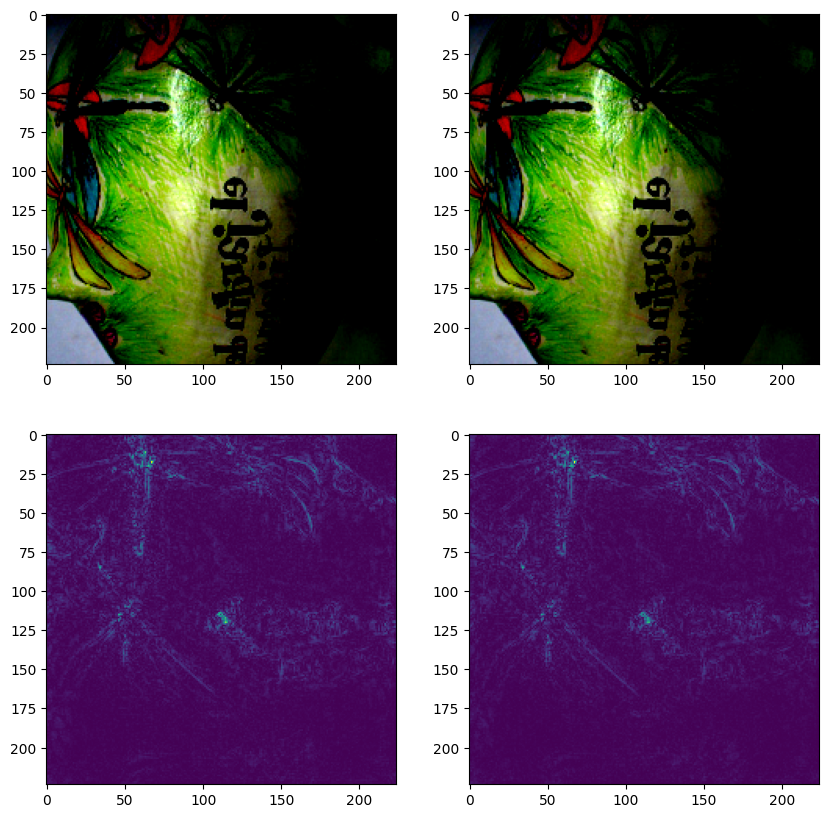

predicted_idx 769
##### tensor([769], device='cuda:0') #####
updated_idx 769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9650657..2.6398337].


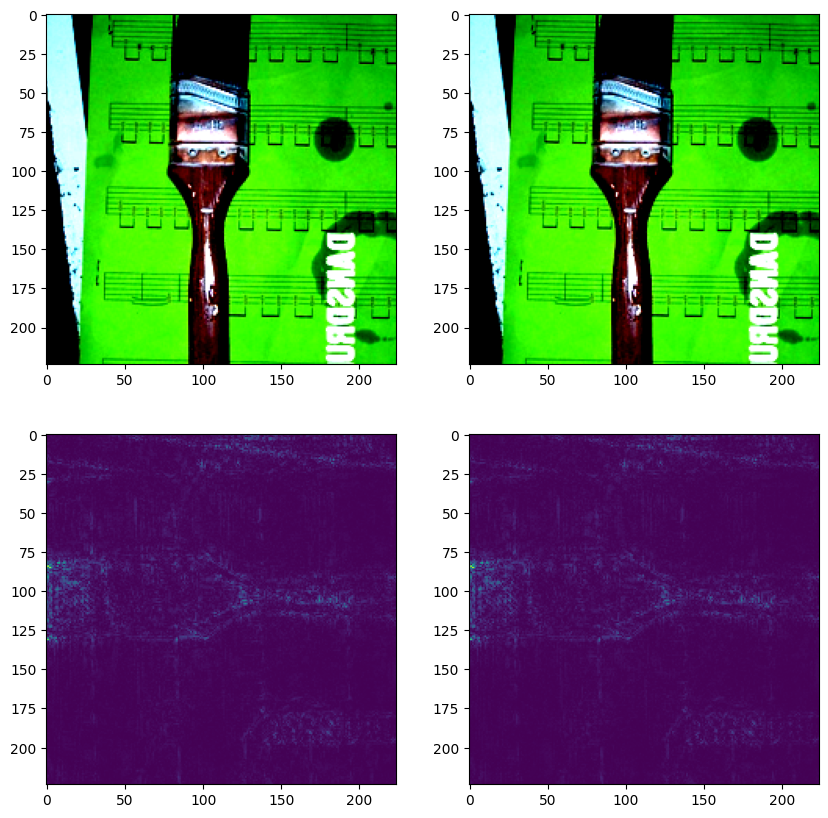

predicted_idx 84
##### tensor([84], device='cuda:0') #####
updated_idx 84


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.100817..2.60514].


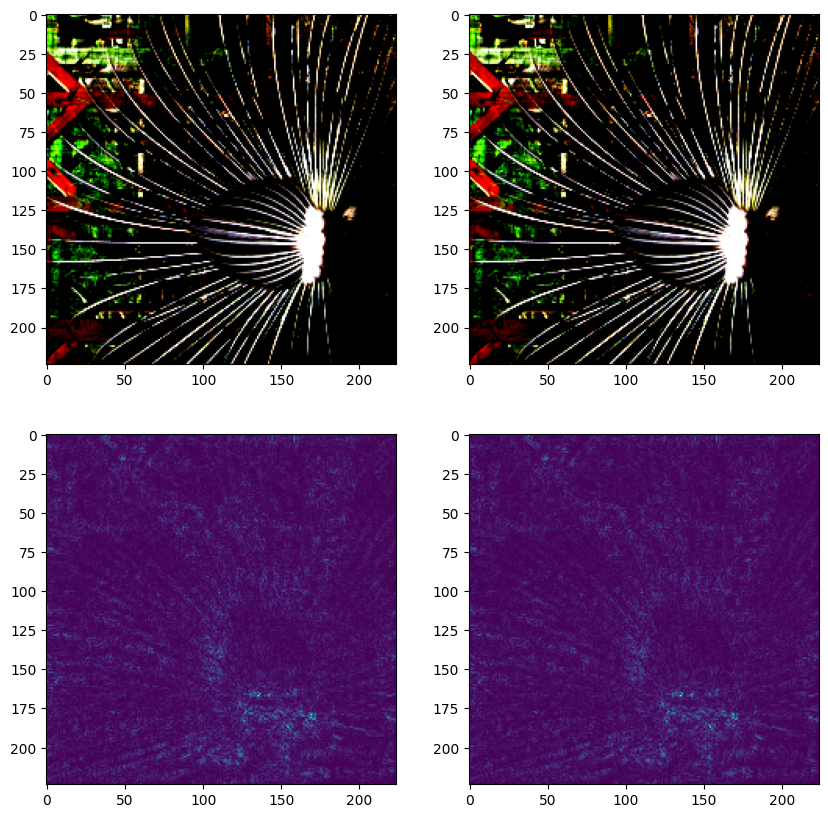

predicted_idx 542
##### tensor([542], device='cuda:0') #####
updated_idx 542


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1202917..2.378417].


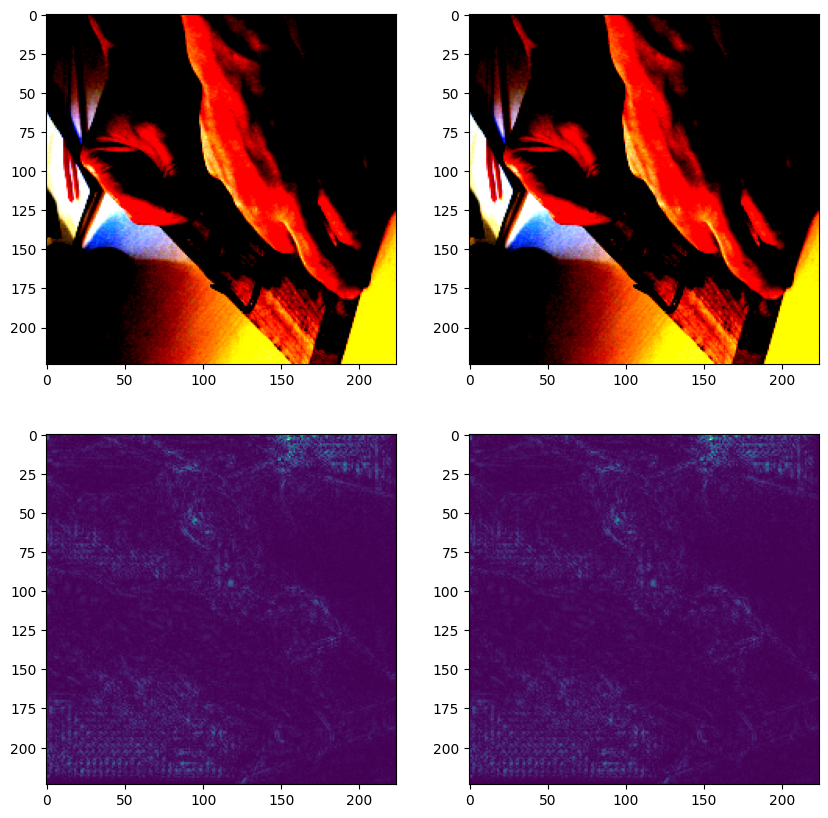

predicted_idx 671
##### tensor([671], device='cuda:0') #####
updated_idx 671


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1180036..2.6400027].


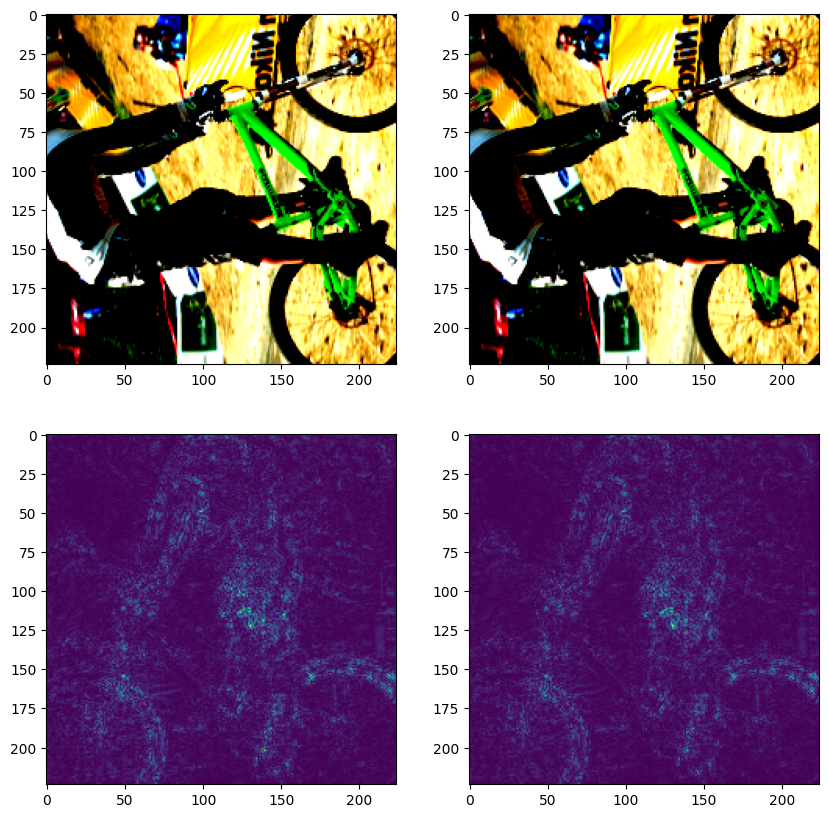

In [7]:
pgd_multi_images(2/255)

predicted_idx 721
##### tensor([721], device='cuda:0') #####
updated_idx 721


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..1.4481792].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151885..1.442634].


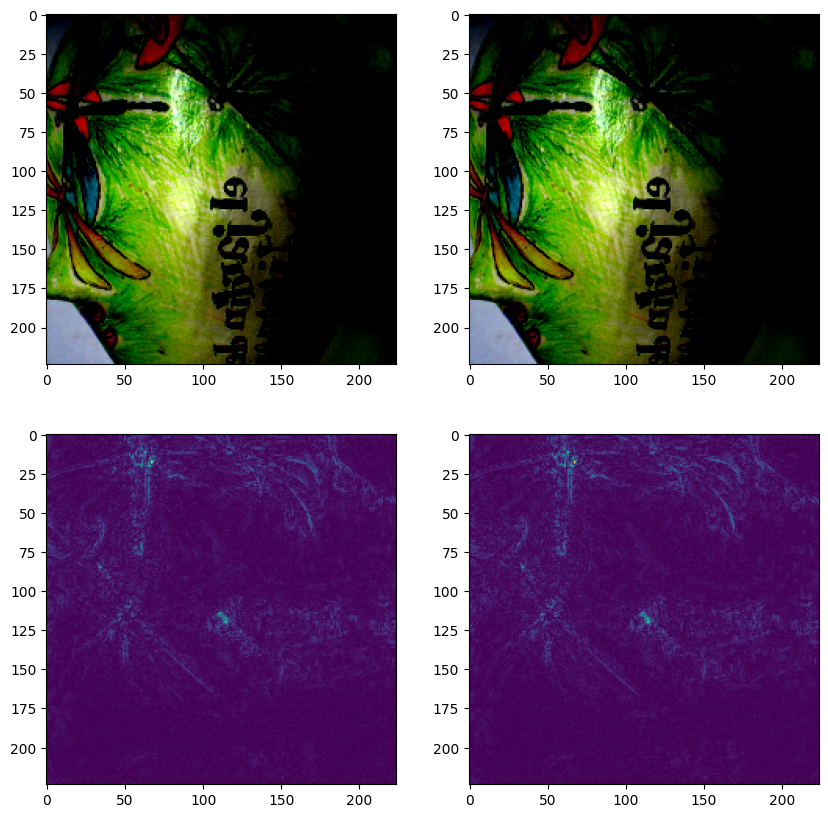

predicted_idx 769
##### tensor([769], device='cuda:0') #####
updated_idx 769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9650666..2.6398337].


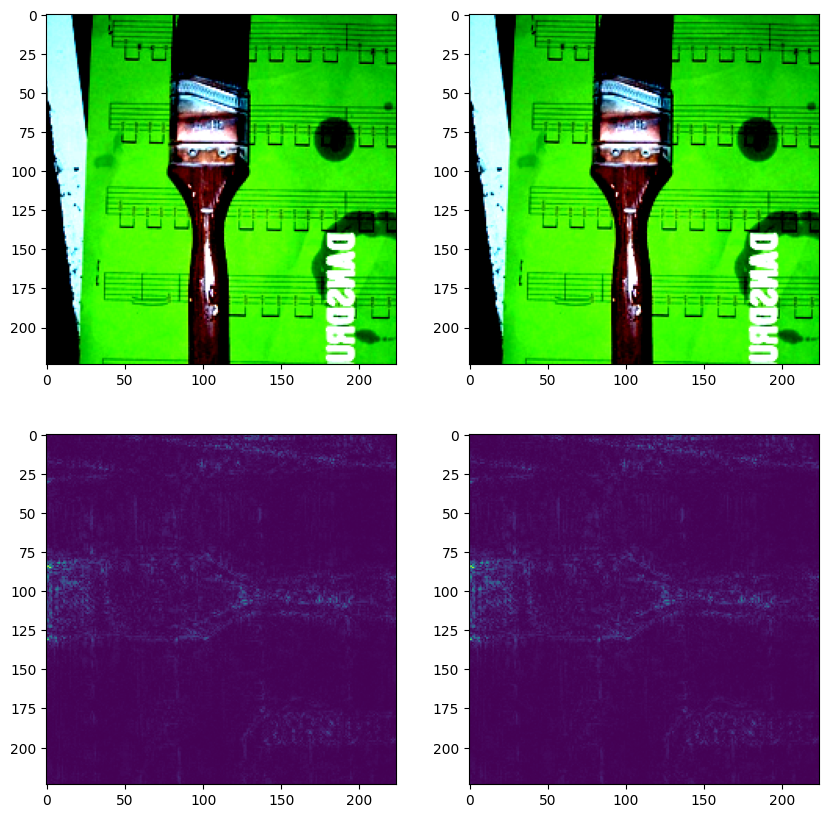

predicted_idx 84
##### tensor([84], device='cuda:0') #####
updated_idx 84


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1008165..2.605138].


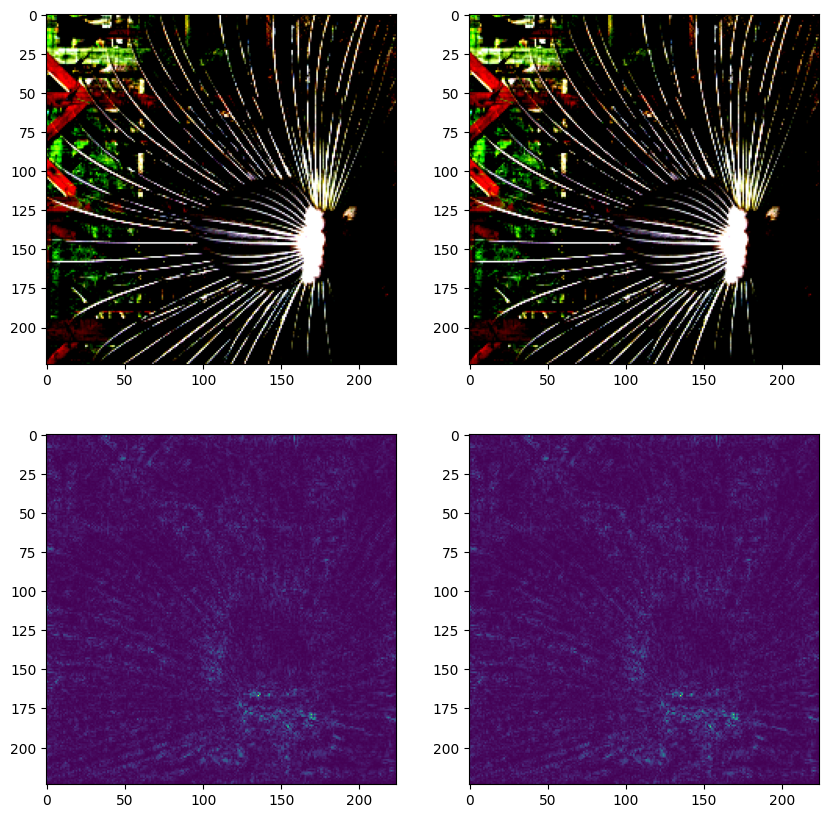

predicted_idx 542
##### tensor([542], device='cuda:0') #####
updated_idx 542


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.120253..2.3784082].


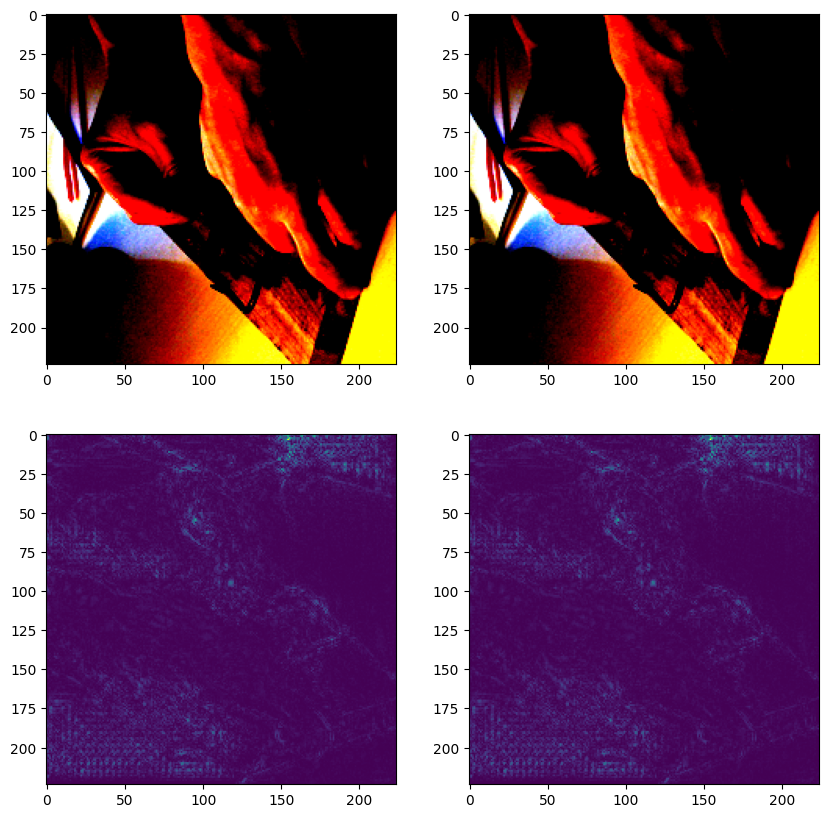

predicted_idx 671
##### tensor([671], device='cuda:0') #####
updated_idx 671


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.118004..2.640004].


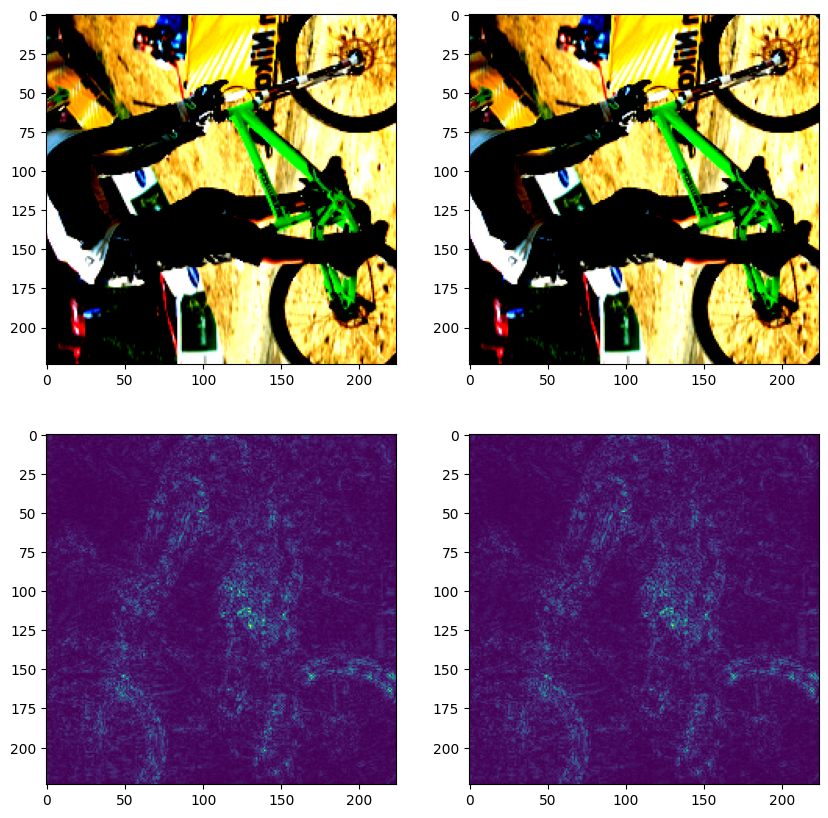

In [8]:
pgd_multi_images(4/255)

predicted_idx 721
##### tensor([721], device='cuda:0') #####
updated_idx 721


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..1.4481792].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151858..1.442619].


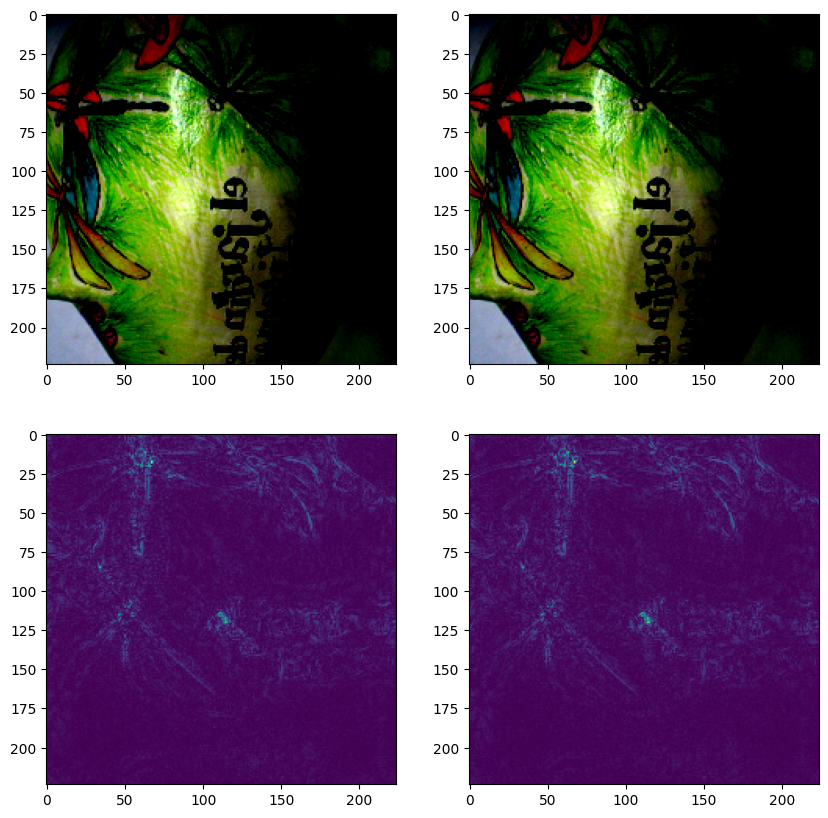

predicted_idx 769
##### tensor([769], device='cuda:0') #####
updated_idx 769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9650627..2.6398344].


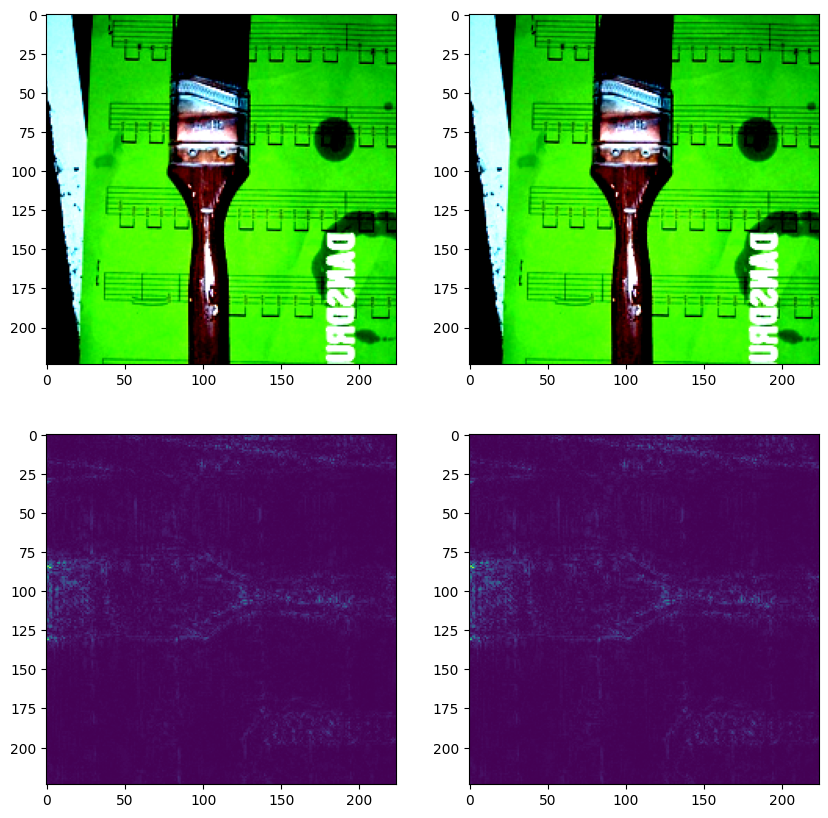

predicted_idx 84
##### tensor([84], device='cuda:0') #####
updated_idx 84


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1008165..2.6051383].


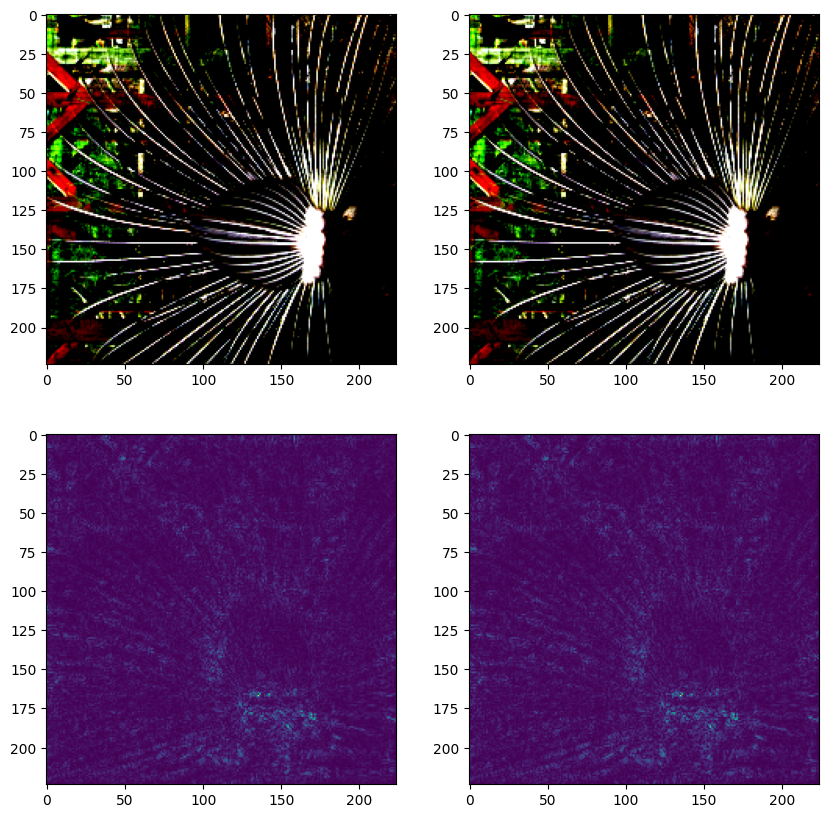

predicted_idx 542
##### tensor([542], device='cuda:0') #####
updated_idx 542


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1202428..2.3784199].


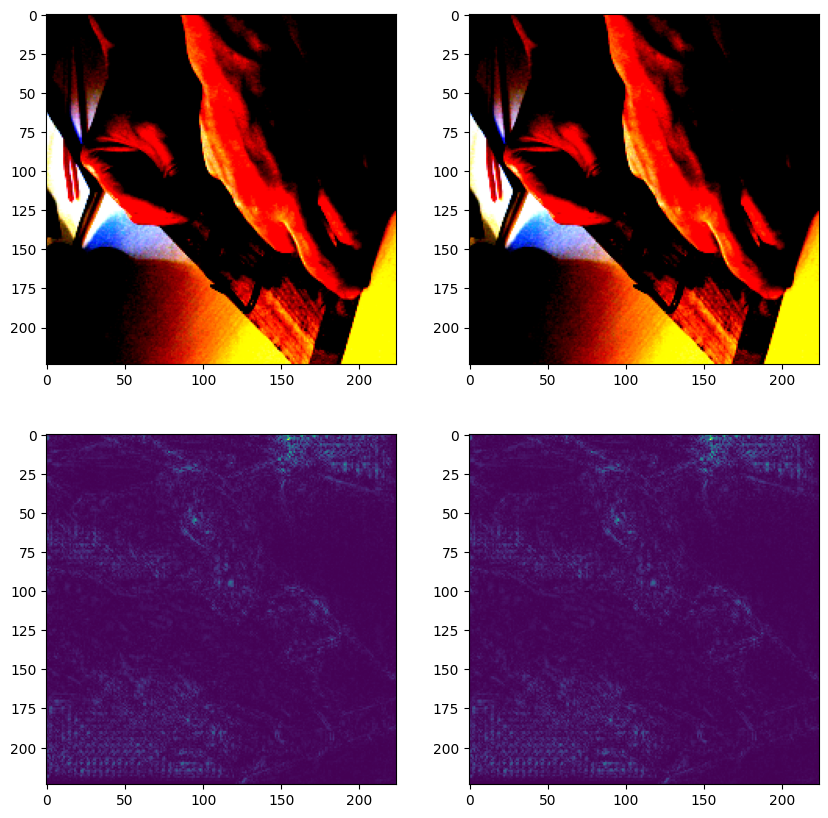

predicted_idx 671
##### tensor([671], device='cuda:0') #####
updated_idx 671


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1180031..2.6400027].


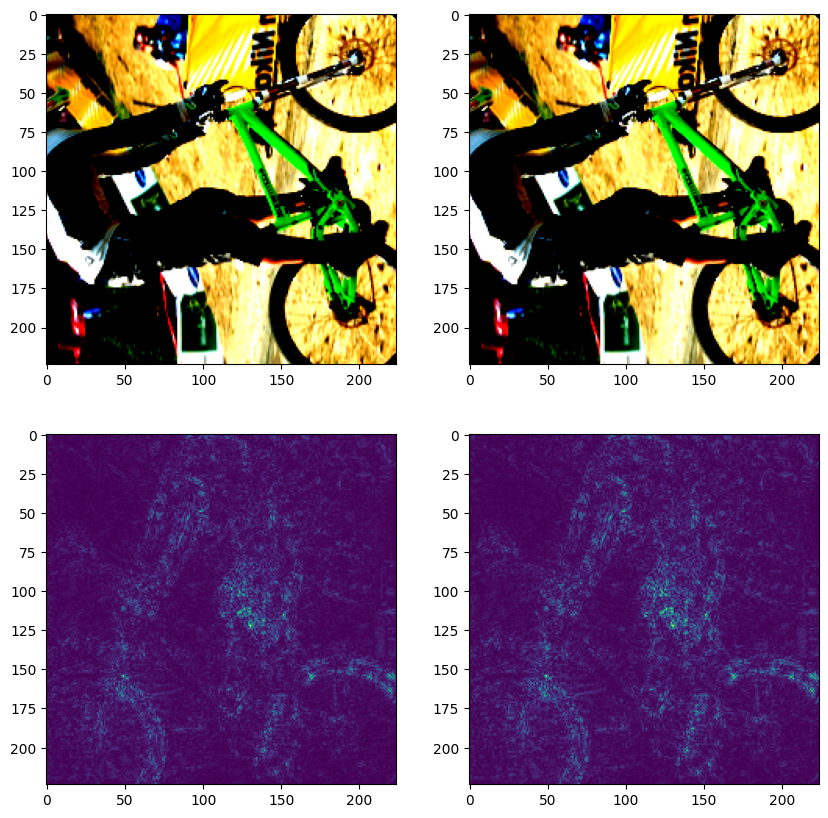

In [9]:
pgd_multi_images(8/255)